In [1]:
# Mounting your Google Drive is optional, and you could also simply copy and
# upload the data to your colab instance. This manula upload is also easy to do, 
# but you will have to figure out how to do it.
from google.colab import drive
drive.mount('/content/gdrive/')

Mounted at /content/gdrive/


In [2]:
import os
if not os.path.exists("/content/gdrive/My Drive/Colab Notebooks/CS_543_MP4"):
    os.makedirs("/content/gdrive/My Drive/Colab Notebooks/CS_543_MP4")
os.chdir("/content/gdrive/My Drive/Colab Notebooks/CS_543_MP4")

In [3]:
# download dataset
!wget https://drive.switch.ch/index.php/s/UG0ZlZXY47LKSaW/download
!unzip download
!rm download
%cd data
!unzip -qqo albertville_rgb.zip
!unzip -qqo albertville_normal.zip
!unzip -qqo albertville_principal_curvature.zip
!unzip -qqo almena_rgb.zip
!unzip -qqo almena_normal.zip
!unzip -qqo almena_principal_curvature.zip
!rm albertville_rgb.zip albertville_normal.zip albertville_principal_curvature.zip almena_rgb.zip almena_normal.zip almena_principal_curvature.zip
%cd ..

--2021-05-03 00:38:48--  https://drive.switch.ch/index.php/s/UG0ZlZXY47LKSaW/download
Resolving drive.switch.ch (drive.switch.ch)... 86.119.34.137, 86.119.34.138, 2001:620:5ca1:1ee::11, ...
Connecting to drive.switch.ch (drive.switch.ch)|86.119.34.137|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: unspecified [application/zip]
Saving to: ‘download’

download                [           <=>      ] 387.57M  18.8MB/s    in 22s     

2021-05-03 00:39:12 (17.5 MB/s) - ‘download’ saved [406396331]

Archive:  download
 extracting: data/albertville_normal.zip  
 extracting: data/albertville_principal_curvature.zip  
 extracting: data/albertville_rgb.zip  
 extracting: data/almena_normal.zip  
 extracting: data/almena_principal_curvature.zip  
 extracting: data/almena_rgb.zip     
/content/gdrive/My Drive/Colab Notebooks/CS_543_MP4/data
/content/gdrive/My Drive/Colab Notebooks/CS_543_MP4


In [4]:
import glob
import os
import numpy as np
import random
import time
from tqdm.notebook import tqdm
import matplotlib.pyplot as plt

import cv2
from PIL import Image
import torch
import torch.nn as nn
import torch.nn.functional as F
from torch.utils import data
from torchvision import models
from torchvision.transforms import ToTensor, Normalize

In [5]:
# global variable
device = torch.device("cuda:0")

In [6]:
#additional block 
def angle_error(prediction, target):
    prediction_error = torch.cosine_similarity(prediction, target)
    prediction_error = torch.clamp(prediction_error, min=-1.0, max=1.0)
    prediction_error = torch.acos(prediction_error) * 180.0 / np.pi
    return prediction_error

def simple_predict(split, model):
    model.eval()
    dataset = NormalDataset(split=split)
    dataloader = data.DataLoader(dataset, batch_size=1, shuffle=False, 
                                 num_workers=2, drop_last=False)
    gts, preds, losses = [], [], []
    total_normal_errors = None
    with torch.no_grad():
        for i, batch in enumerate(tqdm(dataloader)):
            img, gt, mask = batch
            img = img.to(device)
            gt = gt.to(device)
            mask = mask.to(device)

            pred = model(img)
            loss = (F.l1_loss(pred, gt, reduction="none") * mask).mean()

            gts.append((gt[0].permute((1, 2, 0)).cpu().numpy() + 1) / 2)
            preds.append((pred[0].permute((1, 2, 0)).cpu().numpy() + 1) / 2)
            losses.append(loss.item())

            angle_error_prediction = angle_error(pred, gt)
            angle_error_prediction = angle_error_prediction[mask > 0].view(-1)
            if total_normal_errors is None:
                total_normal_errors = angle_error_prediction.cpu().numpy()
            else:
                total_normal_errors = np.concatenate(
                    (total_normal_errors, angle_error_prediction.cpu().numpy())
                )

    return gts, preds, losses, total_normal_errors

class VisualizationDataset(data.Dataset):
    def __init__(self, image_dir="./data/normal_visualization/image", image_ext=".png"):
        self.img_dir = image_dir
        self.img_ext = image_ext
        
        self.image_filenames = [
            os.path.splitext(os.path.basename(l))[0] for l in glob.glob(self.img_dir + "/*" + image_ext)
        ]

    def __len__(self):
        return len(self.image_filenames)

    def __getitem__(self, index):
        filename = self.image_filenames[index]
        img = Image.open(os.path.join(self.img_dir, filename) + self.img_ext)
        img = np.asarray(img).copy()
        img = ToTensor()(img)
        img = Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])(img)
        
        return img.contiguous(), filename

def simple_vis(model):
    model.eval()
    dataset = VisualizationDataset(image_dir="./data/normal_visualization/images")
    dataloader = data.DataLoader(dataset, batch_size=1, shuffle=False, 
                                 num_workers=2, drop_last=False)
    imgs, preds = [], []

    mean = np.array([0.485, 0.456, 0.406])
    std = np.array([0.229, 0.224, 0.225])

    with torch.no_grad():
        for i, batch in enumerate(tqdm(dataloader)):
            img, _ = batch
            img = img.to(device)

            pred = model(img)
            imgs.append(
                std * img[0].permute((1, 2, 0)).cpu().numpy() + mean
            )
            preds.append((pred[0].permute((1, 2, 0)).cpu().numpy() + 1) / 2)

    return imgs, preds

from PIL import Image

def simple_test(model, out_dir):
    model.eval()
    dataset = VisualizationDataset(image_dir="./data/Q2_test_data")
    dataloader = data.DataLoader(dataset, batch_size=1, shuffle=False, 
                                 num_workers=2, drop_last=False)

    with torch.no_grad():
        for i, batch in enumerate(tqdm(dataloader)):
            img, filename = batch
            img = img.to(device)

            pred = model(img)
            pred = ((pred[0].permute((1, 2, 0)).cpu().numpy() + 1) / 2) * 255
            pred = pred.astype(np.uint8)

            output = os.path.join(out_dir, filename[0] + ".png")

            Image.fromarray(pred).save(output)

#additional block 

In [7]:
class NormalDataset(data.Dataset):
    """
    Data loader for the Suface Normal Dataset. If data loading is a bottleneck, 
    you may want to optimize this in for faster training. Possibilities include
    pre-loading all images and annotations into memory before training, so as 
    to limit delays due to disk reads.
    """
    def __init__(self, split="train", data_dir="./data"):
        assert(split in ["train", "val"])
        split2name = {
            "train": "almena",
            "val": "albertville",
        }
        self.img_dir = os.path.join(data_dir, split2name[split] + "_rgb", "rgb")
        self.gt_dir = os.path.join(data_dir, split2name[split] + "_normal", "normal")
        
        self.split = split
        self.filenames = [
            os.path.splitext(os.path.basename(l))[0] for l in glob.glob(self.img_dir + "/*.png")
        ]

    def __len__(self):
        return len(self.filenames)

    def __getitem__(self, index):
        filename = self.filenames[index]
        img = Image.open(os.path.join(self.img_dir, filename) + ".png")
        img = np.asarray(img).copy()
        gt = Image.open(os.path.join(self.gt_dir, filename.replace("_rgb", "_normal")) + ".png")
        gt = np.asarray(gt)

        # from rgb image to surface normal
        gt = gt.astype(np.float32) / 255
        gt = torch.Tensor(np.asarray(gt).copy()).permute((2, 0, 1))
        mask = self.build_mask(gt).to(torch.float)

        img = ToTensor()(img)
        img = Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])(img)

        # normalize gt
        gt = gt * 2 - 1
        
        return img.contiguous(), gt, mask.sum(dim=0) > 0

    @staticmethod
    def build_mask(target, val=0.502, tol=1e-3):
        target = target.unsqueeze(0)
        if target.shape[1] == 1:
            mask = ((target >= val - tol) & (target <= val + tol))
            mask = F.conv2d(mask.float(), torch.ones(1, 1, 5, 5, device=mask.device), padding=2) != 0
            return (~mask).expand_as(target).squeeze(0)

        mask1 = (target[:, 0, :, :] >= val - tol) & (target[:, 0, :, :] <= val + tol)
        mask2 = (target[:, 1, :, :] >= val - tol) & (target[:, 1, :, :] <= val + tol)
        mask3 = (target[:, 2, :, :] >= val - tol) & (target[:, 2, :, :] <= val + tol)
        mask = (mask1 & mask2 & mask3).unsqueeze(1)
        mask = F.conv2d(mask.float(), torch.ones(1, 1, 5, 5, device=mask.device), padding=2) != 0
        return (~mask).expand_as(target).squeeze(0)

In [8]:
##########
#TODO: design your own network here. The expectation is to write from scratch. But it's okay to get some inspiration 
#from conference paper. The bottom line is that you will not just copy code from other repo
##########

class MyModel(nn.Module):

    def __init__(self): # feel free to modify input paramters
        super(MyModel, self).__init__()
        # pass
        #part 2
        # res18 = models.resnet18(pretrained=True)  
        # self.layers = list(res18.children())[:-2]
        # self.layers.append(torch.nn.Conv2d(512,256,1,stride = 1, padding = 0))
        # self.layers.append(torch.nn.BatchNorm2d(256))
        # self.layers.append(torch.nn.ReLU(inplace=True))
        # self.layers.append(torch.nn.Conv2d(256,128,1,stride = 1, padding = 0))
        # self.layers.append(torch.nn.BatchNorm2d(128))
        # self.layers.append(torch.nn.ReLU(inplace=True))
        # self.layers.append(torch.nn.Conv2d(128,64,1,stride = 1, padding = 0))
        # self.layers.append(torch.nn.BatchNorm2d(64))
        # self.layers.append(torch.nn.ReLU(inplace=True))
        # self.layers.append(torch.nn.Conv2d(64,3,1,stride = 1, padding = 0))
        # self.layers.append(torch.nn.Upsample((512,512), mode = 'bilinear'))
        # self.layers = torch.nn.ModuleList(self.layers)

        #part3
        # res18 = models.resnet18(pretrained=True)  
        # self.layers = list(res18.children())[:-2]
        # self.conv0 = torch.nn.Conv2d(512,256,1,stride = 1, padding = 0)
        # self.upsample0 = torch.nn.Upsample(scale_factor=2, mode = 'bilinear')
        # self.conv1 = torch.nn.Conv2d(256,128,1,stride = 1, padding = 0)
        # self.upsample1 = torch.nn.Upsample(scale_factor=2, mode = 'bilinear')
        # self.conv2 = torch.nn.Conv2d(128,64,1,stride = 1, padding = 0)
        # self.upsample2 = torch.nn.Upsample(scale_factor=2, mode = 'bilinear')
        # self.conv3 = torch.nn.Conv2d(64,32,1,stride = 1, padding = 0)
        # self.upsample3 = torch.nn.Upsample(scale_factor=2, mode = 'bilinear')
        # self.conv3 = torch.nn.Conv2d(32,3,1,stride = 1, padding = 0)
        # self.upsample = torch.nn.Upsample(scale_factor=2, mode = 'bilinear')
        # self.layers = torch.nn.ModuleList(self.layers)


        # res18 = models.resnet18(pretrained=True)  
        # self.layers = list(res18.children())[:-2]
        # self.layers.append(torch.nn.Conv2d(512,256,1,stride = 1, padding = 0))
        # self.layers.append(torch.nn.BatchNorm2d(256))
        # self.layers.append(torch.nn.Upsample(scale_factor=2, mode = 'bilinear'))
        # self.layers.append(torch.nn.ReLU(inplace=True))
        # self.layers.append(torch.nn.Conv2d(256,128,1,stride = 1, padding = 0))
        # self.layers.append(torch.nn.BatchNorm2d(128))
        # self.layers.append(torch.nn.Upsample(scale_factor=2, mode = 'bilinear'))
        # self.layers.append(torch.nn.ReLU(inplace=True))
        # self.layers.append(torch.nn.Conv2d(128,64,1,stride = 1, padding = 0))
        # self.layers.append(torch.nn.BatchNorm2d(64))
        # self.layers.append(torch.nn.Upsample(scale_factor=2, mode = 'bilinear'))
        # self.layers.append(torch.nn.ReLU(inplace=True))
        # self.layers.append(torch.nn.BatchNorm2d(64))
        # self.layers.append(torch.nn.Conv2d(64,32,1,stride = 1, padding = 0))
        # self.layers.append(torch.nn.BatchNorm2d(32))
        # self.layers.append(torch.nn.Upsample(scale_factor=2, mode = 'bilinear'))
        # self.layers.append(torch.nn.ReLU(inplace=True))
        # # self.layers.append(torch.nn.MaxPool2d(2, 2))
        # self.layers.append(torch.nn.Conv2d(32,16,1,stride = 1, padding = 0))
        # # self.layers.append(torch.nn.ReLU(inplace=True))
        # self.layers.append(torch.nn.Conv2d(16,3,1,stride = 1, padding = 0))
        
        # self.layers.append(torch.nn.Upsample(scale_factor=2, mode = 'bilinear'))
        # self.layers = torch.nn.ModuleList(self.layers)

        # res18 = models.resnet18(pretrained=True)  
        # self.layers = list(res18.children())[:-2]

        # self.conv512 = torch.nn.Conv2d(512,512,1,stride = 1, padding = 0)
        # self.conv256 = torch.nn.Conv2d(256,256,1,stride = 1, padding = 0)
        # self.conv128 = torch.nn.Conv2d(128,128,1,stride = 1, padding = 0)
        # self.conv64 = torch.nn.Conv2d(64,64,1,stride = 1, padding = 0)
        # self.conv32 = torch.nn.Conv2d(32,32,1,stride = 1, padding = 0)
        # self.conv16 = torch.nn.Conv2d(16,16,1,stride = 1, padding = 0)


        # self.conv0 = torch.nn.Conv2d(512,256,1,stride = 1, padding = 0)
        # self.conv1 = torch.nn.Conv2d(256,128,1,stride = 1, padding = 0)
        # self.conv2 = torch.nn.Conv2d(128,64,1,stride = 1, padding = 0)
        # self.conv3 = torch.nn.Conv2d(64,32,1,stride = 1, padding = 0)
        # self.conv4 = torch.nn.Conv2d(32,3,1,stride = 1, padding = 0)
        # # self.conv5 = torch.nn.Conv2d(16,3,1,stride = 1, padding = 0)

        # self.bn0 = torch.nn.BatchNorm2d(256)
        # self.bn1 = torch.nn.BatchNorm2d(128)
        # self.bn2 = torch.nn.BatchNorm2d(64)
        # self.bn3 = torch.nn.BatchNorm2d(32)
 


        # self.upsample = torch.nn.Upsample(scale_factor=2, mode = 'bilinear')
        # self.layers = torch.nn.ModuleList(self.layers)
        # self.relu = torch.nn.ReLU(inplace=True)

        self.deeplab = torch.hub.load('pytorch/vision:v0.9.0', 'deeplabv3_resnet101', pretrained=True)
        self.deeplab.classifier[4] = torch.nn.Conv2d(256,3,1,1)

 

    def forward(self, x): #*params): # feel free to modify input paramters

        x = self.deeplab(x)['out']
        x = F.normalize(x, dim = 1)
        # print(x.shape)
        return x



# print(MyModel())



In [9]:
##########
#TODO: define your loss function here
##########
# import torch.optim as optim
# criterion = nn.CrossEntropyLoss()

class MyCriterion(nn.Module):
    def __init__(self):
        super(MyCriterion, self).__init__()
        pass

    def forward(self, prediction, target, mask):
      # loss = (F.l1_loss(prediction, target, reduction = "none") * mask).sum()
      loss = (F.l1_loss(prediction, target, reduction = "none") * mask).nansum()/512/512
      # loss = (F.l1_loss(prediction, target, reduction = "none") * mask).mean()
      # print(loss)
      return loss



In [10]:
def simple_train(model, criterion, optimizer, train_dataloader, epoch,**kwargs):
    model.train()
    # TODO: implement your train loop here
    avg_loss = 0.0
    i = 0
    for img,label, mask in train_dataloader:
        img = img.cuda()
        label = label.cuda()
        mask = mask.cuda()
        mask = mask.reshape((mask.shape[0], 1, mask.shape[1], mask.shape[2]))
        mask = torch.cat((mask,mask,mask),axis = 1)
        optimizer.zero_grad()
        pred = model(img)
        loss = criterion(pred, label, mask)
        # print("loss is ", loss)
        i+=1
        avg_loss += loss #/512/512
        loss.backward()
        optimizer.step()
    print("loss in epoch", epoch, "is", avg_loss/i)






Downloading: "https://github.com/pytorch/vision/archive/v0.9.0.zip" to /root/.cache/torch/hub/v0.9.0.zip
Downloading: "https://download.pytorch.org/models/deeplabv3_resnet101_coco-586e9e4e.pth" to /root/.cache/torch/hub/checkpoints/deeplabv3_resnet101_coco-586e9e4e.pth



loss in epoch 0 is tensor(2.0746, device='cuda:0', grad_fn=<DivBackward0>)



Validation loss (L1): 0.28033323232562113
Validation metrics: Mean 37.6, Median 33.3, 11.25deg 16.3, 22.5deg 35.1, 30deg 45.5
loss in epoch 1 is tensor(1.4902, device='cuda:0', grad_fn=<DivBackward0>)
loss in epoch 2 is tensor(1.2730, device='cuda:0', grad_fn=<DivBackward0>)



Validation loss (L1): 0.22155904180855832
Validation metrics: Mean 30.2, Median 22.8, 11.25deg 27.7, 22.5deg 49.6, 30deg 60.0
updated with min_abg =  30.193052


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).



loss in epoch 3 is tensor(1.1480, device='cuda:0', grad_fn=<DivBackward0>)
loss in epoch 4 is tensor(1.0702, device='cuda:0', grad_fn=<DivBackward0>)



Validation loss (L1): 0.23787682930119017
Validation metrics: Mean 32.3, Median 25.5, 11.25deg 24.4, 22.5deg 45.7, 30deg 55.8
loss in epoch 5 is tensor(0.9777, device='cuda:0', grad_fn=<DivBackward0>)
loss in epoch 6 is tensor(0.9161, device='cuda:0', grad_fn=<DivBackward0>)



Validation loss (L1): 0.2027040847027913
Validation metrics: Mean 27.7, Median 19.9, 11.25deg 32.8, 22.5deg 53.9, 30deg 63.3
updated with min_abg =  27.674643


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).



loss in epoch 7 is tensor(0.8671, device='cuda:0', grad_fn=<DivBackward0>)
loss in epoch 8 is tensor(0.8321, device='cuda:0', grad_fn=<DivBackward0>)



Validation loss (L1): 0.20195639037933105
Validation metrics: Mean 27.4, Median 19.4, 11.25deg 32.8, 22.5deg 55.0, 30deg 65.0
updated with min_abg =  27.428452


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).



loss in epoch 9 is tensor(0.7971, device='cuda:0', grad_fn=<DivBackward0>)
loss in epoch 10 is tensor(0.7603, device='cuda:0', grad_fn=<DivBackward0>)



Validation loss (L1): 0.21069513793047676
Validation metrics: Mean 28.6, Median 21.3, 11.25deg 30.6, 22.5deg 51.8, 30deg 62.0
loss in epoch 11 is tensor(0.7365, device='cuda:0', grad_fn=<DivBackward0>)
loss in epoch 12 is tensor(0.7056, device='cuda:0', grad_fn=<DivBackward0>)



Validation loss (L1): 0.22299032817538986
Validation metrics: Mean 30.2, Median 22.9, 11.25deg 26.8, 22.5deg 49.4, 30deg 60.0
loss in epoch 13 is tensor(0.6918, device='cuda:0', grad_fn=<DivBackward0>)
loss in epoch 14 is tensor(0.6645, device='cuda:0', grad_fn=<DivBackward0>)



Validation loss (L1): 0.20195194964225477
Validation metrics: Mean 27.4, Median 19.9, 11.25deg 33.2, 22.5deg 54.1, 30deg 64.2
updated with min_abg =  27.362278


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).



loss in epoch 15 is tensor(0.6514, device='cuda:0', grad_fn=<DivBackward0>)
loss in epoch 16 is tensor(0.6371, device='cuda:0', grad_fn=<DivBackward0>)



Validation loss (L1): 0.21015880084954774
Validation metrics: Mean 28.4, Median 20.8, 11.25deg 32.1, 22.5deg 52.7, 30deg 62.7
loss in epoch 17 is tensor(0.6194, device='cuda:0', grad_fn=<DivBackward0>)
loss in epoch 18 is tensor(0.6108, device='cuda:0', grad_fn=<DivBackward0>)



Validation loss (L1): 0.1972911968254126
Validation metrics: Mean 26.9, Median 18.6, 11.25deg 36.2, 22.5deg 56.0, 30deg 65.5
updated with min_abg =  26.895195


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).



loss in epoch 19 is tensor(0.6028, device='cuda:0', grad_fn=<DivBackward0>)
loss in epoch 20 is tensor(0.5842, device='cuda:0', grad_fn=<DivBackward0>)



Validation loss (L1): 0.2017045209868851
Validation metrics: Mean 27.4, Median 19.4, 11.25deg 33.8, 22.5deg 54.8, 30deg 64.9
loss in epoch 21 is tensor(0.5748, device='cuda:0', grad_fn=<DivBackward0>)
loss in epoch 22 is tensor(0.5677, device='cuda:0', grad_fn=<DivBackward0>)



Validation loss (L1): 0.21091608005838516
Validation metrics: Mean 28.6, Median 20.4, 11.25deg 32.5, 22.5deg 53.2, 30deg 63.0
loss in epoch 23 is tensor(0.5599, device='cuda:0', grad_fn=<DivBackward0>)
loss in epoch 24 is tensor(0.5511, device='cuda:0', grad_fn=<DivBackward0>)



Validation loss (L1): 0.21356639734063393
Validation metrics: Mean 28.9, Median 21.3, 11.25deg 30.7, 22.5deg 51.9, 30deg 62.2
loss in epoch 25 is tensor(0.5393, device='cuda:0', grad_fn=<DivBackward0>)
loss in epoch 26 is tensor(0.5292, device='cuda:0', grad_fn=<DivBackward0>)



Validation loss (L1): 0.21218838813340563
Validation metrics: Mean 28.7, Median 21.5, 11.25deg 32.0, 22.5deg 51.5, 30deg 61.5
loss in epoch 27 is tensor(0.5211, device='cuda:0', grad_fn=<DivBackward0>)
loss in epoch 28 is tensor(0.5113, device='cuda:0', grad_fn=<DivBackward0>)



Validation loss (L1): 0.2106432384914822
Validation metrics: Mean 28.5, Median 21.4, 11.25deg 30.2, 22.5deg 51.8, 30deg 62.4
loss in epoch 29 is tensor(0.5086, device='cuda:0', grad_fn=<DivBackward0>)
final min_avg is 26.895195


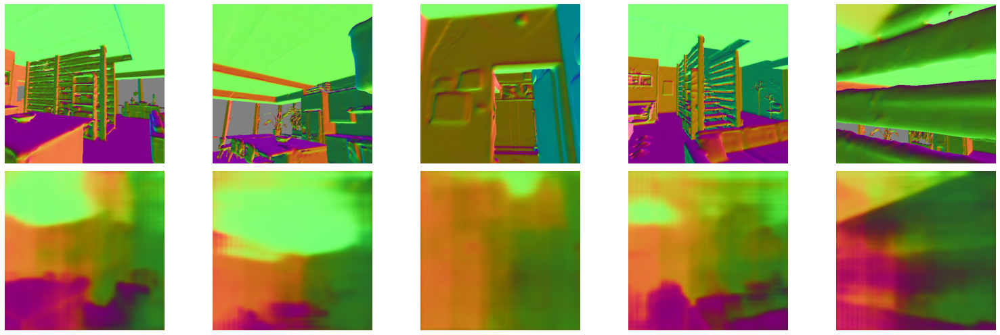

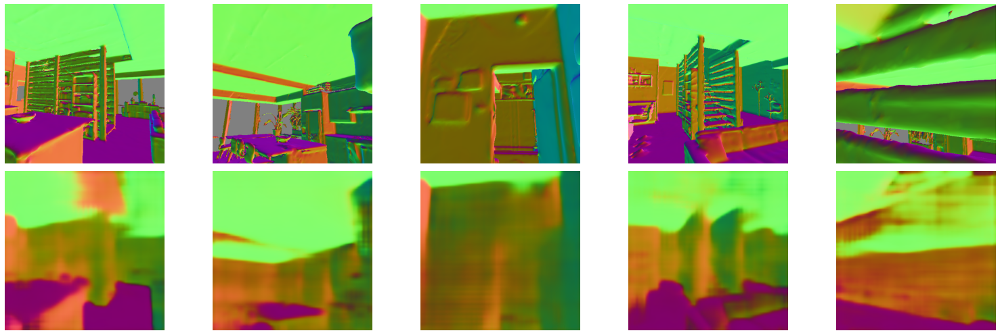

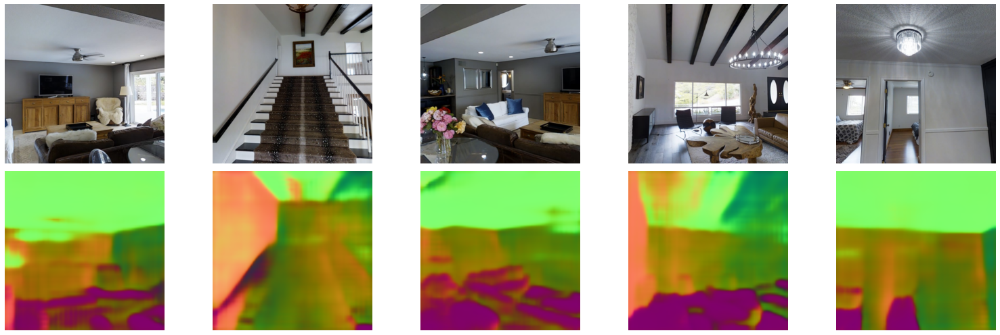

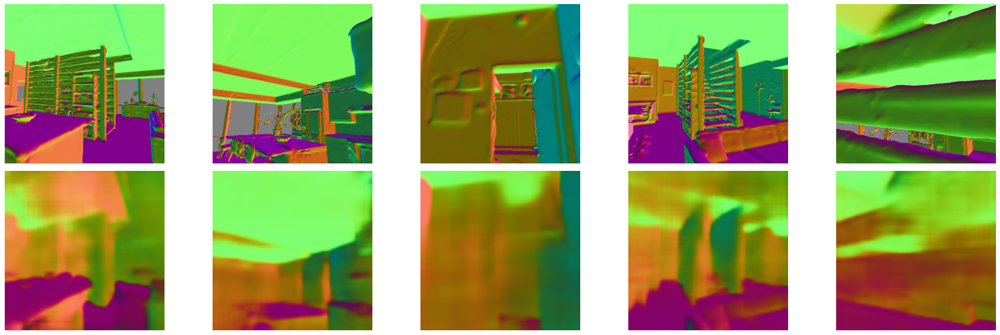

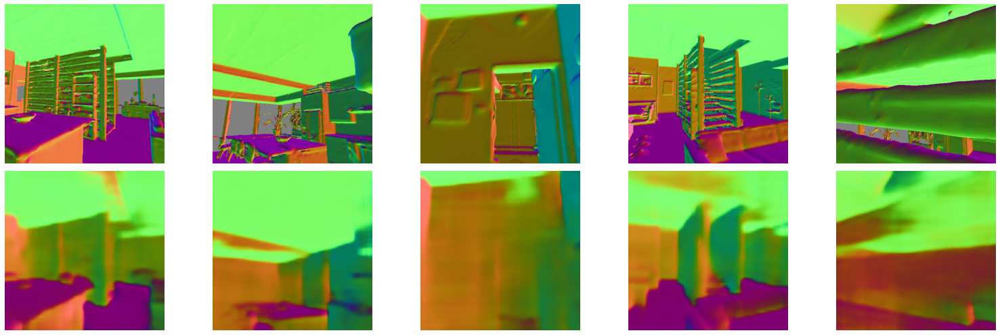

...

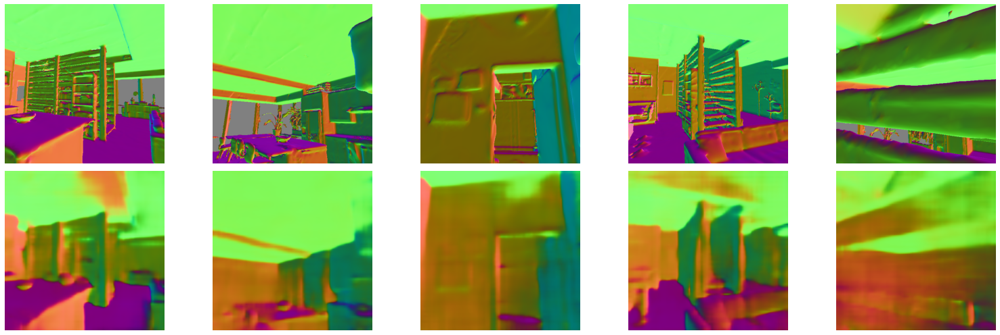

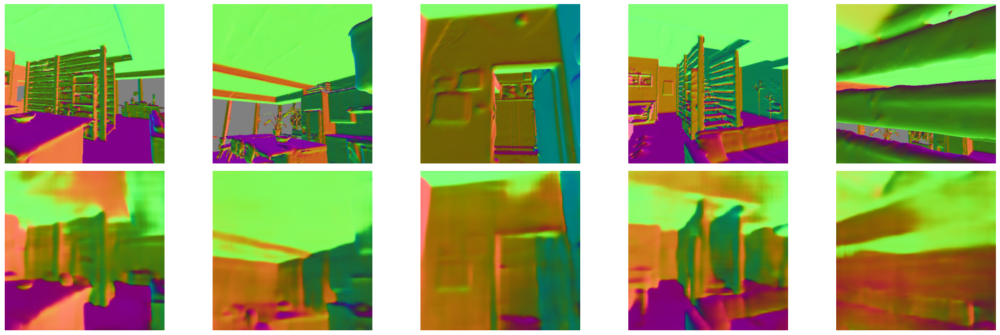

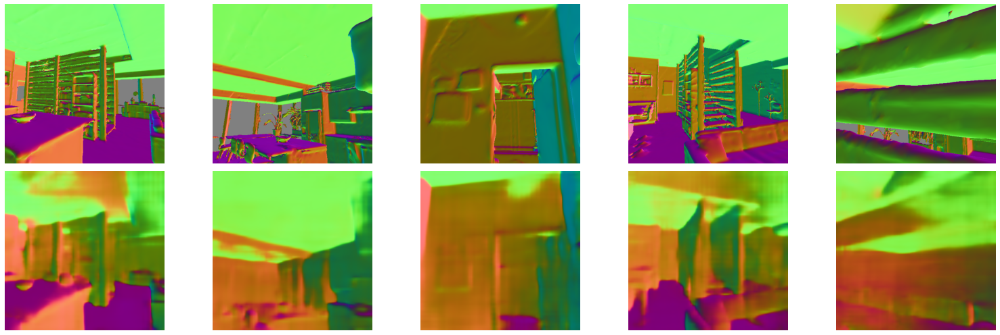

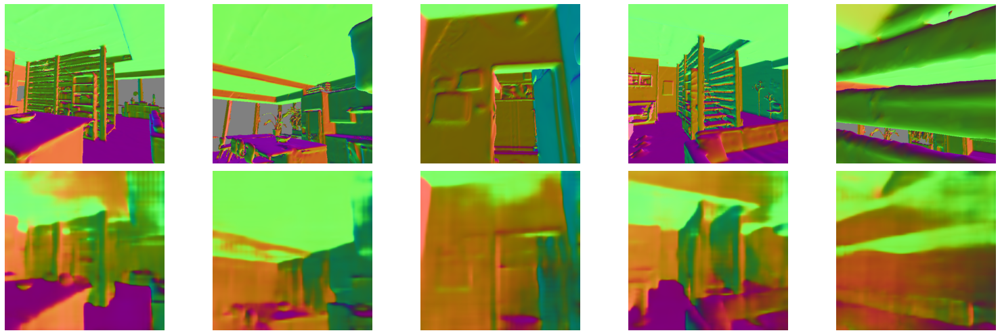

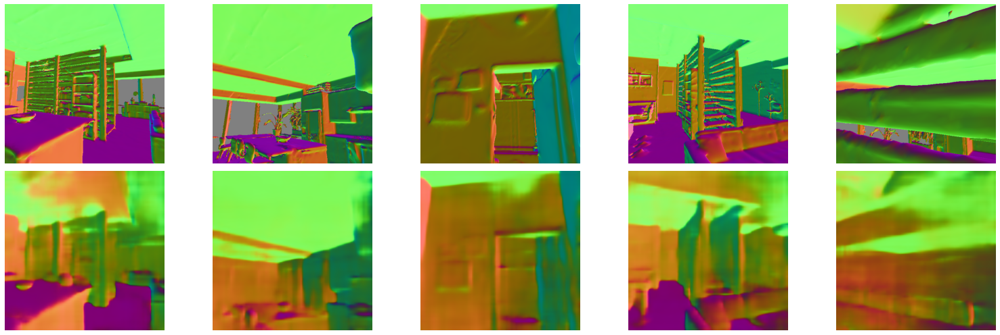

In [11]:
########################################################################
# TODO: Implement your training cycles, make sure you evaluate on validation 
# dataset and compute evaluation metrics every so often. 
# You may also want to save models that perform well.
import torch.optim as optim
model = MyModel().cuda() #to(device)
# model = torch.hub.load('pytorch/vision:v0.9.0', 'deeplabv3_resnet101', pretrained=True).cuda()
# model.eval()
criterion = MyCriterion().cuda() #.to(device)
optimizer = optim.SGD(model.parameters(), lr=0.005, momentum=0.9, weight_decay=0.001)

# optimizer = torch.optim.Adam(model.parameters(),lr=0.005)
# 
train_dataset = NormalDataset(split='train')
train_dataloader = data.DataLoader(train_dataset, batch_size=2, 
                                    shuffle=True, num_workers=2, 
                                    drop_last=True)

num_epochs = 30
IS_GPU = True

# model = model.cuda()
min_avg = 35
for epoch in range(num_epochs):
    simple_train(model, criterion, optimizer, train_dataloader, epoch)
    # consider reducing learning rate
    if epoch % 2 == 0:
      updated = False
      val_gts, val_preds, val_losses, val_total_normal_errors = simple_predict('val', model)
      print("Validation loss (L1):", np.mean(val_losses))
      print("Validation metrics: Mean %.1f, Median %.1f, 11.25deg %.1f, 22.5deg %.1f, 30deg %.1f" % (
          np.average(val_total_normal_errors), np.median(val_total_normal_errors),
          np.sum(val_total_normal_errors < 11.25) / val_total_normal_errors.shape[0] * 100,
          np.sum(val_total_normal_errors < 22.5) / val_total_normal_errors.shape[0] * 100,
          np.sum(val_total_normal_errors < 30) / val_total_normal_errors.shape[0] * 100
      ))

      # vis validation
      fig, axs = plt.subplots(ncols=5, nrows=2, figsize=(22, 7))
      for idx, ax_i in enumerate(axs.T):
          ax = ax_i[0]
          ax.imshow(val_gts[idx])
          ax.axis('off')
          ax = ax_i[1]
          ax.imshow(val_preds[idx])
          ax.axis('off')
      fig.tight_layout()
      plt.savefig('vis_valset.pdf', format='pdf', bbox_inches='tight')
      #check if updated 
      if  np.average(val_total_normal_errors) < min_avg:
             min_avg = np.average(val_total_normal_errors)
             updated = True

      if updated:
        print("updated with min_abg = ", min_avg)
        #visual
        imgs, preds = simple_vis(model)
        fig, axs = plt.subplots(ncols=5, nrows=2, figsize=(22, 7))
        for idx, ax_i in enumerate(axs.T):

            ax = ax_i[0]
            ax.imshow(imgs[idx])
            ax.axis('off')
            ax = ax_i[1]
            ax.imshow(preds[idx])
            ax.axis('off')
        fig.tight_layout()
        plt.savefig('q2_visualization.pdf', format='pdf', bbox_inches='tight')
        #200 pictures

        out_dir = "Q2_normal_predictions"
        os.makedirs(out_dir, exist_ok=True)
        simple_test(model, out_dir)

print("final min_avg is" , min_avg)


# You do not need to change anything below

In [ ]:
########################################################################
# Evaluate your result, and report
# 1. Mean angular error
# 2. Median angular error
# 3. Accuracy at 11.25 degree
# 4. Accuracy at 22.5 degree
# 5. Accuracy at 30 degree
# using provided `simple_predict` function.

def angle_error(prediction, target):
    prediction_error = torch.cosine_similarity(prediction, target)
    prediction_error = torch.clamp(prediction_error, min=-1.0, max=1.0)
    prediction_error = torch.acos(prediction_error) * 180.0 / np.pi
    return prediction_error

def simple_predict(split, model):
    model.eval()
    dataset = NormalDataset(split=split)
    dataloader = data.DataLoader(dataset, batch_size=1, shuffle=False, 
                                 num_workers=2, drop_last=False)
    gts, preds, losses = [], [], []
    total_normal_errors = None
    with torch.no_grad():
        for i, batch in enumerate(tqdm(dataloader)):
            img, gt, mask = batch
            img = img.to(device)
            gt = gt.to(device)
            mask = mask.to(device)

            pred = model(img)
            loss = (F.l1_loss(pred, gt, reduction="none") * mask).mean()

            gts.append((gt[0].permute((1, 2, 0)).cpu().numpy() + 1) / 2)
            preds.append((pred[0].permute((1, 2, 0)).cpu().numpy() + 1) / 2)
            losses.append(loss.item())

            angle_error_prediction = angle_error(pred, gt)
            angle_error_prediction = angle_error_prediction[mask > 0].view(-1)
            if total_normal_errors is None:
                total_normal_errors = angle_error_prediction.cpu().numpy()
            else:
                total_normal_errors = np.concatenate(
                    (total_normal_errors, angle_error_prediction.cpu().numpy())
                )

    return gts, preds, losses, total_normal_errors

val_gts, val_preds, val_losses, val_total_normal_errors = simple_predict('val', model)
print("Validation loss (L1):", np.mean(val_losses))
print("Validation metrics: Mean %.1f, Median %.1f, 11.25deg %.1f, 22.5deg %.1f, 30deg %.1f" % (
    np.average(val_total_normal_errors), np.median(val_total_normal_errors),
    np.sum(val_total_normal_errors < 11.25) / val_total_normal_errors.shape[0] * 100,
    np.sum(val_total_normal_errors < 22.5) / val_total_normal_errors.shape[0] * 100,
    np.sum(val_total_normal_errors < 30) / val_total_normal_errors.shape[0] * 100
))

# vis validation
fig, axs = plt.subplots(ncols=5, nrows=2, figsize=(22, 7))
for idx, ax_i in enumerate(axs.T):
    ax = ax_i[0]
    ax.imshow(val_gts[idx])
    ax.axis('off')
    ax = ax_i[1]
    ax.imshow(val_preds[idx])
    ax.axis('off')
fig.tight_layout()
plt.savefig('vis_valset.pdf', format='pdf', bbox_inches='tight')

In [ ]:
# Visualization
# pick some of your favorite images and put them under `./data/normal_visualization/image`

class VisualizationDataset(data.Dataset):
    def __init__(self, image_dir="./data/normal_visualization/image", image_ext=".png"):
        self.img_dir = image_dir
        self.img_ext = image_ext
        
        self.image_filenames = [
            os.path.splitext(os.path.basename(l))[0] for l in glob.glob(self.img_dir + "/*" + image_ext)
        ]

    def __len__(self):
        return len(self.image_filenames)

    def __getitem__(self, index):
        filename = self.image_filenames[index]
        img = Image.open(os.path.join(self.img_dir, filename) + self.img_ext)
        img = np.asarray(img).copy()
        img = ToTensor()(img)
        img = Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])(img)
        
        return img.contiguous(), filename

def simple_vis(model):
    model.eval()
    dataset = VisualizationDataset(image_dir="./data/normal_visualization/images")
    dataloader = data.DataLoader(dataset, batch_size=1, shuffle=False, 
                                 num_workers=2, drop_last=False)
    imgs, preds = [], []

    mean = np.array([0.485, 0.456, 0.406])
    std = np.array([0.229, 0.224, 0.225])

    with torch.no_grad():
        for i, batch in enumerate(tqdm(dataloader)):
            img, _ = batch
            img = img.to(device)

            pred = model(img)
            imgs.append(
                std * img[0].permute((1, 2, 0)).cpu().numpy() + mean
            )
            preds.append((pred[0].permute((1, 2, 0)).cpu().numpy() + 1) / 2)

    return imgs, preds

imgs, preds = simple_vis(model)
fig, axs = plt.subplots(ncols=5, nrows=2, figsize=(22, 7))
for idx, ax_i in enumerate(axs.T):
    ax = ax_i[0]
    ax.imshow(imgs[idx])
    ax.axis('off')
    ax = ax_i[1]
    ax.imshow(preds[idx])
    ax.axis('off')
fig.tight_layout()
plt.savefig('q2_visualization.pdf', format='pdf', bbox_inches='tight')

In [ ]:
# Test your model on the test set, submit the output to gradescope

from PIL import Image

def simple_test(model, out_dir):
    model.eval()
    dataset = VisualizationDataset(image_dir="./data/Q2_test_data")
    dataloader = data.DataLoader(dataset, batch_size=1, shuffle=False, 
                                 num_workers=2, drop_last=False)

    with torch.no_grad():
        for i, batch in enumerate(tqdm(dataloader)):
            img, filename = batch
            img = img.to(device)

            pred = model(img)
            pred = ((pred[0].permute((1, 2, 0)).cpu().numpy() + 1) / 2) * 255
            pred = pred.astype(np.uint8)

            output = os.path.join(out_dir, filename[0] + ".png")

            Image.fromarray(pred).save(output)

out_dir = "Q2_normal_predictions"
os.makedirs(out_dir, exist_ok=True)
simple_test(model, out_dir)